In [1]:
import numpy as np
import os
import pandas as pd
from IPython.display import Image, display, HTML, Markdown, FileLink
# import imageio
# import pyperclip as clip
from pathlib import Path

# Functions

## For Quantitative Results

In [2]:
def get_experiment_df(exp_path, multirun=True, exclude=None):
    variant_dfs = []
    for variant_dir in os.listdir(exp_path):
        if '_bak' in variant_dir:
            continue
        if os.path.isfile(exp_path / variant_dir):
            continue

        # get runs inside each variant_dir 
        run_dirs = [run_dir for run_dir in os.listdir(exp_path / variant_dir)
                if '.yaml' not in run_dir]
        if len(run_dirs) == 0:
            continue

        # get metrics from each run
        run_dfs = []
        if multirun:
            for run_dir in run_dirs:
                run_df = pd.read_csv(exp_path / variant_dir / run_dir / 'metrics.csv')
                if exclude is not None:
                    run_df = run_df[~run_df['object_name'].isin([exclude])]
                # Add run dir as another column
                run_df['run'] = [run_dir for _ in range(len(run_df))]
                run_dfs.append(run_df)
        else:
            run_df = pd.read_csv(exp_path / variant_dir / 'metrics.csv')
            if exclude is not None:
                run_df = run_df[~run_df['object_name'].isin([exclude])]
            # Add run dir as another column
            run_df['run'] = [variant_dir for _ in range(len(run_df))]
            run_dfs.append(run_df)
            
        variant_df = pd.concat(run_dfs)
        variant_dfs.append(variant_df)
    exp_df = pd.concat(variant_dfs)
    assert np.all(exp_df.isnull().sum() == 0) # assert no NaNs
    return exp_df


def get_unique_evaluation_scenes(exp_df):
    # Get scenes
    run_names = exp_df.run.unique()
    evals = set()
    for run_name in run_names:
        eval_name = run_name.split('-')[0]
        evals.add(eval_name)
    return evals


def get_htmls_mds(exp_df, evals):
    htmls = []
    mds = []
    for eval_name in evals:
        eval_df = exp_df.loc[exp_df['run'].str.contains(eval_name)]
        eval_df = eval_df.drop('scene_idx', axis=1).groupby(['run'])
        count = eval_df.count()['execution']
        sub_max = count != count.max()
        if sub_max.sum() > 0:
            print(f"Warning: {count.loc[sub_max].index[0]} only has {np.array(count.loc[sub_max])[0]} / {count.max()} trials")
        df = eval_df.mean().round(2).astype(str) + " +/- " + eval_df.std().round(1).astype(str)

        htmls.append((eval_name, HTML(df.to_html())))
        mds.append((eval_name, df.to_markdown()))
    return htmls, mds

    
def get_experiment_results(exp_path, multirun=True, exclude=None):
    exp_df = get_experiment_df(exp_path, multirun=multirun, exclude=exclude)
    evals = get_unique_evaluation_scenes(exp_df)
    htmls, mds = get_htmls_mds(exp_df, evals)
    return exp_df, evals, htmls, mds
    

def print_htmls_mds(htmls, mds):
    # Pretty print
    for (eval_name, html) in htmls:
        display(Markdown(f'# {eval_name} evaluation'))
        display(html)

    # Print raw for pasting into Notion
    for (eval_name, md) in mds:
        print(f"# {eval_name} evaluation")
        print(md)
        with open(exp_path / 'results.md', 'w') as f:
            f.write(md)

## For Qualitative Results

In [3]:
def sample_gifs(eval_name, variant, exp_df, success=False, num_samples=5, seed=0):
    # get success and failure cases for specific evals and variants
    # Don't print all of them but get them manually for now, 
    # Since printing all of them is expensive
    eval_df = exp_df.loc[exp_df['run'].str.contains(eval_name)]
    variant_df = eval_df.loc[eval_df['run'].str.contains(f'-{variant}-')]
    full_variant_name = variant_df['run'].iloc[0]
    selection = variant_df['execution'] == success

    # turn into gifs
    success_df = variant_df.loc[selection]
    paths = success_df[["object_name", "scene_idx"]].apply(lambda x: "_".join([str(y) for y in x]), axis=1)

    variant_path_list = list(exp_path.glob(f'*/{full_variant_name}'))
    assert len(variant_path_list) == 1
    variant_path = variant_path_list[0]

    idxs = paths.index
    np.random.seed(seed)
    sampled_idxs = np.random.choice(idxs, size=num_samples, replace=False)
    ims = []
    for idx in sampled_idxs:
        path = variant_path / 'gifs' / f'{paths[idx]}.gif'
#         display(FileLink(Path('/mnt/exx/' + str(path))))
        print(path.parts[-3:])
        im = Image(open(path,'rb').read())
        display(im)
        ims.append(im)
    return ims

# Results 

## Experiment: 3obj learned acronym

In [9]:
root_dir='/media/thomasweng/manifolds/pybullet_eval/multirun'
exp_name = '3obj_learned'
exp_path = Path(f'{root_dir}/{exp_name}')
exp_df, evals, htmls, mds = get_experiment_results(exp_path)
print_htmls_mds(htmls, mds)

# acronym evaluation

,execution,planning,smoothness,collision,time
run,,,,,
acronym-GF_learned_newparams_ctrlpts-0,0.19 +/- 0.4,0.4 +/- 0.5,56.48 +/- 48.6,6.4 +/- 20.1,20.95 +/- 8.3
acronym-GF_learned_newparams_lm2pi-1,0.06 +/- 0.2,0.37 +/- 0.5,46.23 +/- 46.0,5.12 +/- 8.8,23.14 +/- 6.0
acronym-GF_learned_newparams_lmsplit2pi-2,0.04 +/- 0.2,0.42 +/- 0.5,56.13 +/- 52.0,7.62 +/- 16.0,20.2 +/- 8.3
acronym-GF_learned_newparams_lmsplit4-3,0.04 +/- 0.2,0.33 +/- 0.5,38.84 +/- 42.2,7.17 +/- 17.5,25.37 +/- 3.6


# acronym evaluation
| run                                       | execution    | planning     | smoothness     | collision     | time          |
|:------------------------------------------|:-------------|:-------------|:---------------|:--------------|:--------------|
| acronym-GF_learned_newparams_ctrlpts-0    | 0.19 +/- 0.4 | 0.4 +/- 0.5  | 56.48 +/- 48.6 | 6.4 +/- 20.1  | 20.95 +/- 8.3 |
| acronym-GF_learned_newparams_lm2pi-1      | 0.06 +/- 0.2 | 0.37 +/- 0.5 | 46.23 +/- 46.0 | 5.12 +/- 8.8  | 23.14 +/- 6.0 |
| acronym-GF_learned_newparams_lmsplit2pi-2 | 0.04 +/- 0.2 | 0.42 +/- 0.5 | 56.13 +/- 52.0 | 7.62 +/- 16.0 | 20.2 +/- 8.3  |
| acronym-GF_learned_newparams_lmsplit4-3   | 0.04 +/- 0.2 | 0.33 +/- 0.5 | 38.84 +/- 42.2 | 7.17 +/- 17.5 | 25.37 +/- 3.6 |


('acronym-GF_learned_newparams_lm2pi-1', 'gifs', 'Mug_40f9a6cc6b2c3b3a78060a3a3a55e18f_0.0006670441940038386_0.gif')


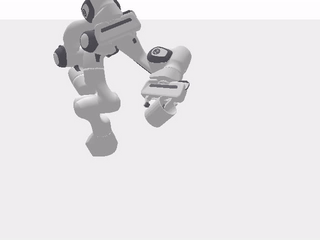

('acronym-GF_learned_newparams_lm2pi-1', 'gifs', 'Bowl_9a52843cc89cd208362be90aaa182ec6_0.0008104428339208306_5.gif')


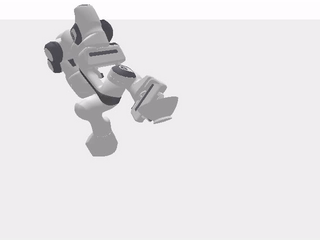

('acronym-GF_learned_newparams_lm2pi-1', 'gifs', 'Mug_40f9a6cc6b2c3b3a78060a3a3a55e18f_0.0006670441940038386_22.gif')


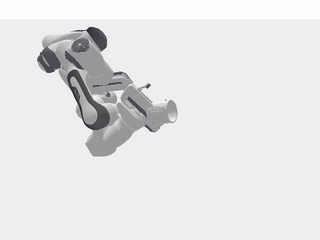

('acronym-GF_learned_newparams_lm2pi-1', 'gifs', 'Bottle_244894af3ba967ccd957eaf7f4edb205_0.012953570261294404_14.gif')


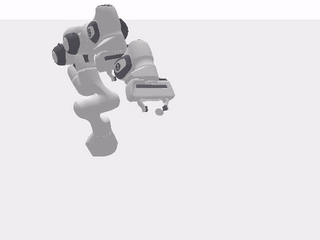

('acronym-GF_learned_newparams_lm2pi-1', 'gifs', 'Mug_40f9a6cc6b2c3b3a78060a3a3a55e18f_0.0006670441940038386_16.gif')


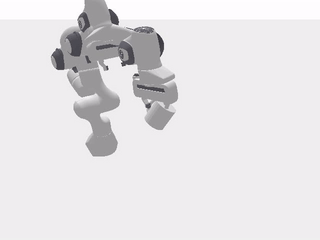

In [18]:
eval_name = 'acronym'
variant = 'GF_learned_newparams_lm2pi'
ims = sample_gifs(eval_name, variant, exp_df, success=False, num_samples=5)

## Experiment: Scaling Logmaps More Finely

In [6]:
root_dir='/media/thomasweng/manifolds/pybullet_eval/multirun'
exp_name = 'GF_lmscale_fine'
exp_path = Path(f'{root_dir}/{exp_name}')
exclude='Book_b1611143b4da5c783143cfc9128d0843_0.023835858278933857'
exp_df, evals, htmls, mds = get_experiment_results(exp_path, exclude=exclude)
print_htmls_mds(htmls, mds)

# ycb evaluation

,execution,planning,smoothness,collision,time
run,,,,,
ycb-GF_known_initik_newparams-1.5-9,0.71 +/- 0.5,0.53 +/- 0.5,17.55 +/- 7.8,28.77 +/- 39.5,43.13 +/- 32.1
ycb-GF_known_initik_newparams-3.0-11,0.76 +/- 0.4,0.45 +/- 0.5,15.75 +/- 7.7,31.04 +/- 38.6,43.66 +/- 31.3
ycb-GF_known_initik_newparams-4.0-13,0.77 +/- 0.4,0.38 +/- 0.5,16.43 +/- 9.3,31.27 +/- 39.3,48.07 +/- 30.0
ycb-GF_known_initik_newparams-6.0-15,0.76 +/- 0.4,0.28 +/- 0.5,22.89 +/- 18.5,28.73 +/- 34.0,56.54 +/- 26.8
ycb-GF_known_newparams-1.5-1,0.77 +/- 0.4,0.53 +/- 0.5,18.8 +/- 8.8,24.45 +/- 33.9,47.57 +/- 26.8
ycb-GF_known_newparams-3.0-3,0.83 +/- 0.4,0.43 +/- 0.5,19.65 +/- 10.5,26.59 +/- 34.0,52.07 +/- 23.5
ycb-GF_known_newparams-4.0-5,0.8 +/- 0.4,0.38 +/- 0.5,22.08 +/- 10.6,27.58 +/- 38.0,55.92 +/- 21.7
ycb-GF_known_newparams-6.0-7,0.81 +/- 0.4,0.23 +/- 0.4,28.12 +/- 17.8,25.24 +/- 28.1,61.62 +/- 17.5


# acronym evaluation

,execution,planning,smoothness,collision,time
run,,,,,
acronym-GF_known_initik_newparams-1.5-8,0.71 +/- 0.5,0.84 +/- 0.4,6.07 +/- 4.6,2.09 +/- 3.1,29.34 +/- 24.2
acronym-GF_known_initik_newparams-3.0-10,0.73 +/- 0.4,0.79 +/- 0.4,6.05 +/- 4.4,2.0 +/- 2.8,30.97 +/- 25.3
acronym-GF_known_initik_newparams-4.0-12,0.7 +/- 0.5,0.8 +/- 0.4,5.81 +/- 3.2,1.9 +/- 2.8,30.87 +/- 24.8
acronym-GF_known_initik_newparams-6.0-14,0.74 +/- 0.4,0.76 +/- 0.4,6.14 +/- 3.6,1.98 +/- 2.9,34.94 +/- 25.8
acronym-GF_known_newparams-1.5-0,0.74 +/- 0.4,0.87 +/- 0.3,11.1 +/- 5.2,1.86 +/- 2.7,33.53 +/- 20.1
acronym-GF_known_newparams-3.0-2,0.7 +/- 0.5,0.82 +/- 0.4,11.51 +/- 5.7,1.85 +/- 2.6,35.58 +/- 21.9
acronym-GF_known_newparams-4.0-4,0.76 +/- 0.4,0.82 +/- 0.4,12.07 +/- 6.2,1.65 +/- 2.3,35.66 +/- 21.6
acronym-GF_known_newparams-6.0-6,0.7 +/- 0.5,0.69 +/- 0.5,12.12 +/- 5.5,1.79 +/- 2.6,43.71 +/- 25.8


# ycb evaluation
| run                                  | execution    | planning     | smoothness     | collision      | time           |
|:-------------------------------------|:-------------|:-------------|:---------------|:---------------|:---------------|
| ycb-GF_known_initik_newparams-1.5-9  | 0.71 +/- 0.5 | 0.53 +/- 0.5 | 17.55 +/- 7.8  | 28.77 +/- 39.5 | 43.13 +/- 32.1 |
| ycb-GF_known_initik_newparams-3.0-11 | 0.76 +/- 0.4 | 0.45 +/- 0.5 | 15.75 +/- 7.7  | 31.04 +/- 38.6 | 43.66 +/- 31.3 |
| ycb-GF_known_initik_newparams-4.0-13 | 0.77 +/- 0.4 | 0.38 +/- 0.5 | 16.43 +/- 9.3  | 31.27 +/- 39.3 | 48.07 +/- 30.0 |
| ycb-GF_known_initik_newparams-6.0-15 | 0.76 +/- 0.4 | 0.28 +/- 0.5 | 22.89 +/- 18.5 | 28.73 +/- 34.0 | 56.54 +/- 26.8 |
| ycb-GF_known_newparams-1.5-1         | 0.77 +/- 0.4 | 0.53 +/- 0.5 | 18.8 +/- 8.8   | 24.45 +/- 33.9 | 47.57 +/- 26.8 |
| ycb-GF_known_newparams-3.0-3         | 0.83 +/- 0.4 | 0.43 +/- 0.5 | 19.65 +/- 10.5 | 26.59 +/- 34.0 | 52.07 +/- 23.5 |
| ycb-G

('acronym-GF_known_newparams-4.0-4', 'gifs', 'Bottle_244894af3ba967ccd957eaf7f4edb205_0.012953570261294404_27.gif')


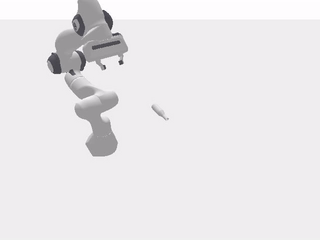

('acronym-GF_known_newparams-4.0-4', 'gifs', 'Mug_40f9a6cc6b2c3b3a78060a3a3a55e18f_0.0006670441940038386_13.gif')


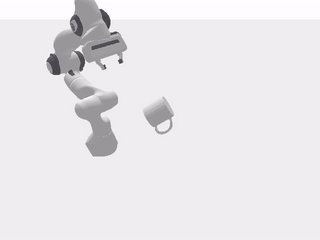

('acronym-GF_known_newparams-4.0-4', 'gifs', 'Mug_40f9a6cc6b2c3b3a78060a3a3a55e18f_0.0006670441940038386_19.gif')


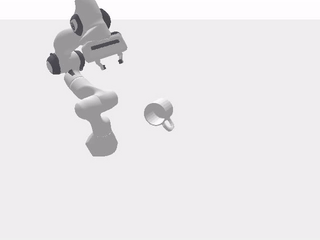

('acronym-GF_known_newparams-4.0-4', 'gifs', 'Bowl_9a52843cc89cd208362be90aaa182ec6_0.0008104428339208306_18.gif')


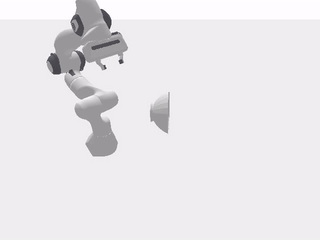

('acronym-GF_known_newparams-4.0-4', 'gifs', 'Mug_40f9a6cc6b2c3b3a78060a3a3a55e18f_0.0006670441940038386_1.gif')


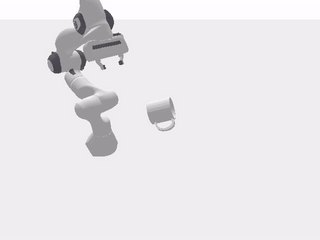

('acronym-GF_known_newparams-4.0-4', 'gifs', 'Bowl_9a52843cc89cd208362be90aaa182ec6_0.0008104428339208306_28.gif')


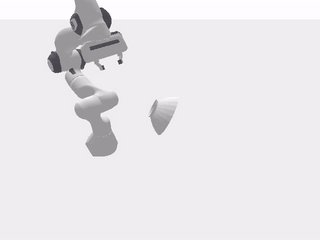

('acronym-GF_known_newparams-4.0-4', 'gifs', 'Bottle_244894af3ba967ccd957eaf7f4edb205_0.012953570261294404_14.gif')


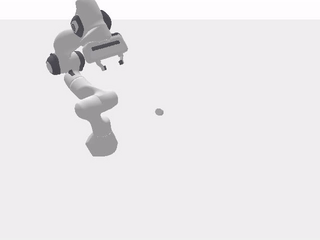

('acronym-GF_known_newparams-4.0-4', 'gifs', 'Bowl_9a52843cc89cd208362be90aaa182ec6_0.0008104428339208306_24.gif')


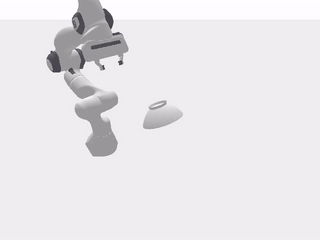

('acronym-GF_known_newparams-4.0-4', 'gifs', 'Bowl_9a52843cc89cd208362be90aaa182ec6_0.0008104428339208306_12.gif')


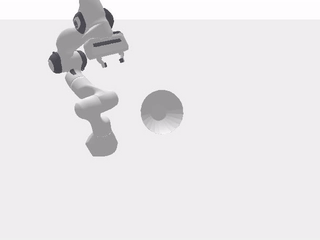

('acronym-GF_known_newparams-4.0-4', 'gifs', 'Mug_40f9a6cc6b2c3b3a78060a3a3a55e18f_0.0006670441940038386_7.gif')


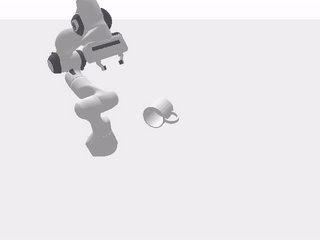

[<IPython.core.display.Image object>,
 <IPython.core.display.Image object>,
 <IPython.core.display.Image object>,
 <IPython.core.display.Image object>,
 <IPython.core.display.Image object>,
 <IPython.core.display.Image object>,
 <IPython.core.display.Image object>,
 <IPython.core.display.Image object>,
 <IPython.core.display.Image object>,
 <IPython.core.display.Image object>]

In [7]:
eval_name = 'acronym'
variant = 'GF_known_newparams-4.0'
sample_gifs(eval_name, variant, exp_df, success=False, num_samples=10)

## Experiment: obstacle cost weight

In [24]:
root_dir='/home/thomasweng/data/manifolds/pybullet_eval/multirun'
exp_name = 'GF_collision'
exp_path = Path(f'{root_dir}/{exp_name}')
exp_df, evals, htmls, mds = get_experiment_results(exp_path)
print_htmls_mds(htmls, mds)

# acronym evaluation

,execution,planning,smoothness,collision,time
run,,,,,
acronym-GF_known_newparams-logmap-4.0-15.0-2,0.72 +/- 0.5,0.78 +/- 0.4,10.58 +/- 6.3,1.32 +/- 2.4,43.14 +/- 26.2
acronym-GF_known_newparams-logmap-4.0-5.0-0,0.68 +/- 0.5,0.8 +/- 0.4,11.01 +/- 6.0,1.31 +/- 2.4,41.08 +/- 26.0


# ycb evaluation

,execution,planning,smoothness,collision,time
run,,,,,
ycb-GF_known_newparams-logmap-4.0-15.0-3,0.8 +/- 0.4,0.36 +/- 0.5,22.42 +/- 11.8,27.17 +/- 36.6,63.92 +/- 24.6
ycb-GF_known_newparams-logmap-4.0-5.0-1,0.76 +/- 0.4,0.33 +/- 0.5,21.52 +/- 11.5,28.54 +/- 40.7,66.02 +/- 23.2


# acronym evaluation
| run                                          | execution    | planning     | smoothness    | collision    | time           |
|:---------------------------------------------|:-------------|:-------------|:--------------|:-------------|:---------------|
| acronym-GF_known_newparams-logmap-4.0-15.0-2 | 0.72 +/- 0.5 | 0.78 +/- 0.4 | 10.58 +/- 6.3 | 1.32 +/- 2.4 | 43.14 +/- 26.2 |
| acronym-GF_known_newparams-logmap-4.0-5.0-0  | 0.68 +/- 0.5 | 0.8 +/- 0.4  | 11.01 +/- 6.0 | 1.31 +/- 2.4 | 41.08 +/- 26.0 |
# ycb evaluation
| run                                      | execution    | planning     | smoothness     | collision      | time           |
|:-----------------------------------------|:-------------|:-------------|:---------------|:---------------|:---------------|
| ycb-GF_known_newparams-logmap-4.0-15.0-3 | 0.8 +/- 0.4  | 0.36 +/- 0.5 | 22.42 +/- 11.8 | 27.17 +/- 36.6 | 63.92 +/- 24.6 |
| ycb-GF_known_newparams-logmap-4.0-5.0-1  | 0.76 +/- 0.4 | 0.33 +/- 0.5 | 2

In [ ]:
| run                                          | execution    | planning     | smoothness    | collision    | time           |
|:---------------------------------------------|:-------------|:-------------|:--------------|:-------------|:---------------|
| acronym-GF_known_newparams-logmap-4.0-15.0-2 | 0.72 +/- 0.5 | 0.78 +/- 0.4 | 10.58 +/- 6.3 | 1.32 +/- 2.4 | 43.14 +/- 26.2 |
| acronym-GF_known_newparams-logmap-4.0-5.0-0  | 0.68 +/- 0.5 | 0.8 +/- 0.4  | 11.01 +/- 6.0 | 1.31 +/- 2.4 | 41.08 +/- 26.0 |
| ycb-GF_known_newparams-logmap-4.0-15.0-3 | 0.8 +/- 0.4  | 0.36 +/- 0.5 | 22.42 +/- 11.8 | 27.17 +/- 36.6 | 63.92 +/- 24.6 |
| ycb-GF_known_newparams-logmap-4.0-5.0-1  | 0.76 +/- 0.4 | 0.33 +/- 0.5 | 21.52 +/- 11.5 | 28.54 +/- 40.7 | 66.02 +/- 23.2 |

## Experiment: consider finger = True

In [15]:
root_dir='/home/thomasweng/data/manifolds/pybullet_eval/multirun'
exp_name = 'GF_considerfinger'
exp_path = Path(f'{root_dir}/{exp_name}')
exp_df, evals, htmls, mds = get_experiment_results(exp_path)
print_htmls_mds(htmls, mds)

# acronym evaluation

,execution,planning,smoothness,collision,time
run,,,,,
acronym-GF_known_newparams-logmap-3.0-False-0,0.75 +/- 0.4,0.85 +/- 0.4,11.29 +/- 6.3,1.36 +/- 2.7,39.0 +/- 23.9
acronym-GF_known_newparams-logmap-3.0-True-0,0.74 +/- 0.4,0.79 +/- 0.4,8.56 +/- 5.7,26.05 +/- 18.7,44.21 +/- 24.1


# ycb evaluation

,execution,planning,smoothness,collision,time
run,,,,,
ycb-GF_known_newparams-logmap-3.0-False-1,0.84 +/- 0.4,0.42 +/- 0.5,19.63 +/- 10.5,26.67 +/- 34.4,60.4 +/- 27.4
ycb-GF_known_newparams-logmap-3.0-True-1,0.77 +/- 0.4,0.42 +/- 0.5,19.82 +/- 11.1,105.16 +/- 59.2,59.11 +/- 26.5


# acronym evaluation
| run                                           | execution    | planning     | smoothness    | collision      | time           |
|:----------------------------------------------|:-------------|:-------------|:--------------|:---------------|:---------------|
| acronym-GF_known_newparams-logmap-3.0-False-0 | 0.75 +/- 0.4 | 0.85 +/- 0.4 | 11.29 +/- 6.3 | 1.36 +/- 2.7   | 39.0 +/- 23.9  |
| acronym-GF_known_newparams-logmap-3.0-True-0  | 0.74 +/- 0.4 | 0.79 +/- 0.4 | 8.56 +/- 5.7  | 26.05 +/- 18.7 | 44.21 +/- 24.1 |
# ycb evaluation
| run                                       | execution    | planning     | smoothness     | collision       | time           |
|:------------------------------------------|:-------------|:-------------|:---------------|:----------------|:---------------|
| ycb-GF_known_newparams-logmap-3.0-False-1 | 0.84 +/- 0.4 | 0.42 +/- 0.5 | 19.63 +/- 10.5 | 26.67 +/- 34.4  | 60.4 +/- 27.4  |
| ycb-GF_known_newparams-logmap-3.0-True-1  | 0.77 +/- 0.4

In [25]:
eval_name = 'ycb'
variant = 'GF_known_newparams-logmap-3.0-False'
ims = sample_gifs(eval_name, variant, exp_df, success=True, num_samples=10)

IndexError: single positional indexer is out-of-bounds

In [ ]:
| run                                          | execution    | planning     | smoothness   | collision      | time           |
|:---------------------------------------------|:-------------|:-------------|:-------------|:---------------|:---------------|
| acronym-GF_known_newparams-logmap-3.0-True-0 | 0.74 +/- 0.4 | 0.79 +/- 0.4 | 8.56 +/- 5.7 | 26.05 +/- 18.7 | 44.21 +/- 24.1 |
| ycb-GF_known_newparams-logmap-3.0-True-1 | 0.77 +/- 0.4 | 0.42 +/- 0.5 | 19.82 +/- 11.1 | 105.16 +/- 59.2 | 59.11 +/- 26.5 |

## Experiment: Log map using Gripper Tip

In [31]:
# root_dir='/data/manifolds/pybullet_eval/dbg'
# exp_name = 'GF_ctrlpts'
# exp_path = Path(f'{root_dir}/{exp_name}')
# exp_df, evals, htmls, mds = get_experiment_results(exp_path, multirun=False)
root_dir='/data/manifolds/pybullet_eval/multirun'
exp_name = 'GF_logmaptip'
exp_path = Path(f'{root_dir}/{exp_name}')
exp_df, evals, htmls, mds = get_experiment_results(exp_path)
print_htmls_mds(htmls, mds)

FileNotFoundError: [Errno 2] No such file or directory: '/data/manifolds/pybullet_eval/multirun/GF_logmaptip'

In [27]:
eval_name = 'ycb'
variant = 'GF_known_newparams-logmaptip-4.0'
ims = sample_gifs(eval_name, variant, exp_df, success=True, num_samples=10)

IndexError: single positional indexer is out-of-bounds

## Experiment: Control Points

In [11]:
# root_dir='/data/manifolds/pybullet_eval/dbg'
# exp_name = 'GF_ctrlpts'
# exp_path = Path(f'{root_dir}/{exp_name}')
# exp_df, evals, htmls, mds = get_experiment_results(exp_path, multirun=False)
root_dir='/data/manifolds/pybullet_eval/multirun'
exp_name = 'GF_ctrlpts'
exp_path = Path(f'{root_dir}/{exp_name}')
exp_df, evals, htmls, mds = get_experiment_results(exp_path)
print_htmls_mds(htmls, mds)

# ycb evaluation

,execution,planning,smoothness,collision,time
run,,,,,
ycb-GF_known_newparams-control_points-1,0.07 +/- 0.3,0.14 +/- 0.3,21.73 +/- 6.7,37.62 +/- 38.4,71.05 +/- 6.0


# acronym evaluation

,execution,planning,smoothness,collision,time
run,,,,,
acronym-GF_known_newparams-control_points-0,0.39 +/- 0.5,0.57 +/- 0.5,8.82 +/- 5.5,3.63 +/- 9.9,69.21 +/- 22.0


# ycb evaluation
| run                                     | execution    | planning     | smoothness    | collision      | time          |
|:----------------------------------------|:-------------|:-------------|:--------------|:---------------|:--------------|
| ycb-GF_known_newparams-control_points-1 | 0.07 +/- 0.3 | 0.14 +/- 0.3 | 21.73 +/- 6.7 | 37.62 +/- 38.4 | 71.05 +/- 6.0 |
# acronym evaluation
| run                                         | execution    | planning     | smoothness   | collision    | time           |
|:--------------------------------------------|:-------------|:-------------|:-------------|:-------------|:---------------|
| acronym-GF_known_newparams-control_points-0 | 0.39 +/- 0.5 | 0.57 +/- 0.5 | 8.82 +/- 5.5 | 3.63 +/- 9.9 | 69.21 +/- 22.0 |


## Experiment: Scaling Logmaps

In [51]:
root_dir='/data/manifolds/pybullet_eval/multirun'
exp_name = 'GF_lmscale'
exp_path = Path(f'{root_dir}/{exp_name}')
exp_df, evals, htmls, mds = get_experiment_results(exp_path)
print_htmls_mds(htmls, mds)

# acronym evaluation

,execution,planning,smoothness,collision,time
run,,,,,
acronym-GF_known_initik_newparams-0.7-8,0.64 +/- 0.5,0.83 +/- 0.4,4.72 +/- 2.6,1.59 +/- 3.3,37.58 +/- 29.4
acronym-GF_known_initik_newparams-2.0-10,0.68 +/- 0.5,0.79 +/- 0.4,6.3 +/- 5.7,1.46 +/- 2.7,36.71 +/- 29.5
acronym-GF_known_initik_newparams-32.0-14,0.59 +/- 0.5,0.59 +/- 0.5,8.86 +/- 6.9,1.71 +/- 2.7,81.95 +/- 23.4
acronym-GF_known_initik_newparams-8.0-12,0.73 +/- 0.4,0.74 +/- 0.4,6.93 +/- 5.9,1.62 +/- 2.8,42.87 +/- 29.9
acronym-GF_known_newparams-0.7-0,0.65 +/- 0.5,0.85 +/- 0.4,6.63 +/- 2.5,1.98 +/- 4.8,46.48 +/- 26.2
acronym-GF_known_newparams-2.0-2,0.74 +/- 0.4,0.86 +/- 0.4,11.37 +/- 5.9,1.29 +/- 2.5,36.77 +/- 23.6
acronym-GF_known_newparams-32.0-6,0.54 +/- 0.5,0.44 +/- 0.5,18.67 +/- 9.0,1.51 +/- 2.5,89.81 +/- 9.5
acronym-GF_known_newparams-8.0-4,0.68 +/- 0.5,0.7 +/- 0.5,11.98 +/- 6.0,1.37 +/- 2.3,51.72 +/- 28.0


# ycb evaluation

,execution,planning,smoothness,collision,time
run,,,,,
ycb-GF_known_initik_newparams-0.7-9,0.6 +/- 0.5,0.6 +/- 0.5,15.22 +/- 5.2,22.19 +/- 34.5,54.23 +/- 34.8
ycb-GF_known_initik_newparams-2.0-11,0.82 +/- 0.4,0.51 +/- 0.5,16.25 +/- 6.4,31.39 +/- 39.6,43.27 +/- 36.5
ycb-GF_known_initik_newparams-32.0-15,0.73 +/- 0.4,0.35 +/- 0.5,20.27 +/- 15.4,27.85 +/- 22.8,63.5 +/- 31.2
ycb-GF_known_initik_newparams-8.0-13,0.72 +/- 0.5,0.29 +/- 0.5,21.16 +/- 14.4,28.6 +/- 33.5,62.69 +/- 28.3
ycb-GF_known_newparams-0.7-1,0.55 +/- 0.5,0.64 +/- 0.5,14.4 +/- 5.4,15.13 +/- 20.6,65.87 +/- 22.3
ycb-GF_known_newparams-2.0-3,0.82 +/- 0.4,0.47 +/- 0.5,18.52 +/- 10.2,26.63 +/- 33.0,52.64 +/- 29.4
ycb-GF_known_newparams-32.0-7,0.38 +/- 0.5,0.08 +/- 0.3,45.47 +/- 16.3,22.29 +/- 18.8,78.92 +/- 4.7
ycb-GF_known_newparams-8.0-5,0.73 +/- 0.4,0.23 +/- 0.4,28.24 +/- 13.7,26.23 +/- 30.9,71.56 +/- 16.8


# acronym evaluation
| run                                       | execution    | planning     | smoothness    | collision    | time           |
|:------------------------------------------|:-------------|:-------------|:--------------|:-------------|:---------------|
| acronym-GF_known_initik_newparams-0.7-8   | 0.64 +/- 0.5 | 0.83 +/- 0.4 | 4.72 +/- 2.6  | 1.59 +/- 3.3 | 37.58 +/- 29.4 |
| acronym-GF_known_initik_newparams-2.0-10  | 0.68 +/- 0.5 | 0.79 +/- 0.4 | 6.3 +/- 5.7   | 1.46 +/- 2.7 | 36.71 +/- 29.5 |
| acronym-GF_known_initik_newparams-32.0-14 | 0.59 +/- 0.5 | 0.59 +/- 0.5 | 8.86 +/- 6.9  | 1.71 +/- 2.7 | 81.95 +/- 23.4 |
| acronym-GF_known_initik_newparams-8.0-12  | 0.73 +/- 0.4 | 0.74 +/- 0.4 | 6.93 +/- 5.9  | 1.62 +/- 2.8 | 42.87 +/- 29.9 |
| acronym-GF_known_newparams-0.7-0          | 0.65 +/- 0.5 | 0.85 +/- 0.4 | 6.63 +/- 2.5  | 1.98 +/- 4.8 | 46.48 +/- 26.2 |
| acronym-GF_known_newparams-2.0-2          | 0.74 +/- 0.4 | 0.86 +/- 0.4 | 11.37 +/- 5.9 | 1.29 +/- 2.5 | 36.7

/mnt/exx/data/manifolds/pybullet_eval/multirun/GF_lmscale/GF_known_initik_newparams_2022-06-24_192423/ycb-GF_known_initik_newparams-2.0-11/gifs/021_bleach_cleanser_scene_31.gif

('ycb-GF_known_initik_newparams-2.0-11', 'gifs', '021_bleach_cleanser_scene_31.gif')


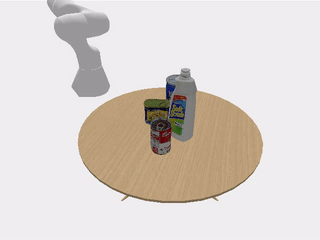

/mnt/exx/data/manifolds/pybullet_eval/multirun/GF_lmscale/GF_known_initik_newparams_2022-06-24_192423/ycb-GF_known_initik_newparams-2.0-11/gifs/006_mustard_bottle_scene_56.gif

('ycb-GF_known_initik_newparams-2.0-11', 'gifs', '006_mustard_bottle_scene_56.gif')


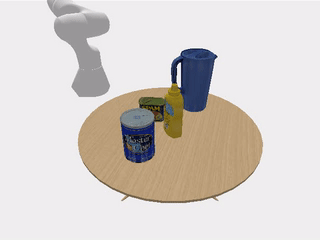

/mnt/exx/data/manifolds/pybullet_eval/multirun/GF_lmscale/GF_known_initik_newparams_2022-06-24_192423/ycb-GF_known_initik_newparams-2.0-11/gifs/005_tomato_soup_can_scene_65.gif

('ycb-GF_known_initik_newparams-2.0-11', 'gifs', '005_tomato_soup_can_scene_65.gif')


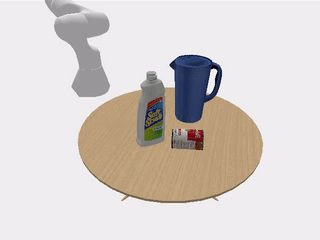

/mnt/exx/data/manifolds/pybullet_eval/multirun/GF_lmscale/GF_known_initik_newparams_2022-06-24_192423/ycb-GF_known_initik_newparams-2.0-11/gifs/005_tomato_soup_can_scene_75.gif

('ycb-GF_known_initik_newparams-2.0-11', 'gifs', '005_tomato_soup_can_scene_75.gif')


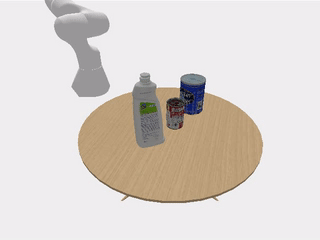

/mnt/exx/data/manifolds/pybullet_eval/multirun/GF_lmscale/GF_known_initik_newparams_2022-06-24_192423/ycb-GF_known_initik_newparams-2.0-11/gifs/021_bleach_cleanser_scene_88.gif

('ycb-GF_known_initik_newparams-2.0-11', 'gifs', '021_bleach_cleanser_scene_88.gif')


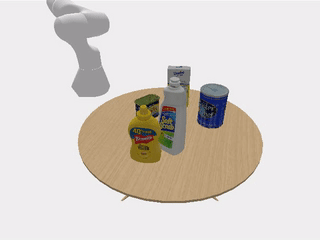

/mnt/exx/data/manifolds/pybullet_eval/multirun/GF_lmscale/GF_known_initik_newparams_2022-06-24_192423/ycb-GF_known_initik_newparams-2.0-11/gifs/004_sugar_box_scene_50.gif

('ycb-GF_known_initik_newparams-2.0-11', 'gifs', '004_sugar_box_scene_50.gif')


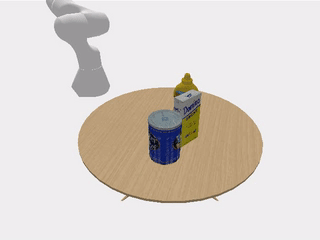

/mnt/exx/data/manifolds/pybullet_eval/multirun/GF_lmscale/GF_known_initik_newparams_2022-06-24_192423/ycb-GF_known_initik_newparams-2.0-11/gifs/021_bleach_cleanser_scene_35.gif

('ycb-GF_known_initik_newparams-2.0-11', 'gifs', '021_bleach_cleanser_scene_35.gif')


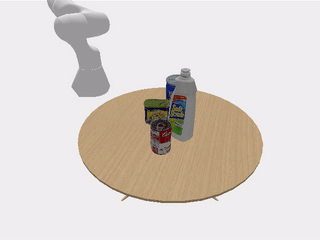

/mnt/exx/data/manifolds/pybullet_eval/multirun/GF_lmscale/GF_known_initik_newparams_2022-06-24_192423/ycb-GF_known_initik_newparams-2.0-11/gifs/006_mustard_bottle_scene_94.gif

('ycb-GF_known_initik_newparams-2.0-11', 'gifs', '006_mustard_bottle_scene_94.gif')


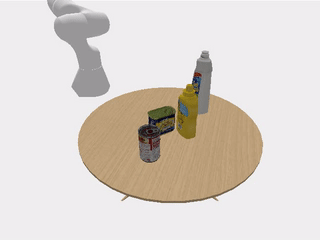

/mnt/exx/data/manifolds/pybullet_eval/multirun/GF_lmscale/GF_known_initik_newparams_2022-06-24_192423/ycb-GF_known_initik_newparams-2.0-11/gifs/005_tomato_soup_can_scene_96.gif

('ycb-GF_known_initik_newparams-2.0-11', 'gifs', '005_tomato_soup_can_scene_96.gif')


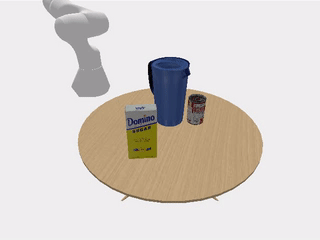

/mnt/exx/data/manifolds/pybullet_eval/multirun/GF_lmscale/GF_known_initik_newparams_2022-06-24_192423/ycb-GF_known_initik_newparams-2.0-11/gifs/004_sugar_box_scene_74.gif

('ycb-GF_known_initik_newparams-2.0-11', 'gifs', '004_sugar_box_scene_74.gif')


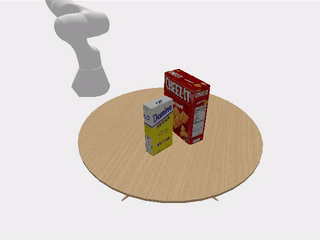

[<IPython.core.display.Image object>,
 <IPython.core.display.Image object>,
 <IPython.core.display.Image object>,
 <IPython.core.display.Image object>,
 <IPython.core.display.Image object>,
 <IPython.core.display.Image object>,
 <IPython.core.display.Image object>,
 <IPython.core.display.Image object>,
 <IPython.core.display.Image object>,
 <IPython.core.display.Image object>]

In [52]:
# eval_name = 'acronym'
eval_name = 'ycb'
variant = 'GF_known_initik_newparams-2.0'
sample_gifs(eval_name, variant, exp_df, success=False, num_samples=10)

# Results on with/without Initial IK, with/without new params

In [96]:
root_dir='/data/manifolds/pybullet_eval/multirun'
exp_name = 'GF_poststandoff'
exp_path = Path(f'{root_dir}/{exp_name}')
exp_df, evals, htmls, mds = get_experiment_results(exp_path)
print_htmls_mds(htmls, mds)

# acronym evaluation

,execution,planning,smoothness,collision,time
run,,,,,
acronym-GF_known-0,0.28 +/- 0.5,0.96 +/- 0.2,7.42 +/- 5.3,0.19 +/- 1.0,38.88 +/- 9.5
acronym-GF_known_initik,0.6 +/- 0.5,0.87 +/- 0.3,4.82 +/- 2.5,1.68 +/- 3.0,23.83 +/- 12.8
acronym-GF_known_initik_newparams-4,0.72 +/- 0.4,0.84 +/- 0.4,5.03 +/- 2.8,1.63 +/- 3.0,29.97 +/- 25.6
acronym-GF_known_newparams-3,0.71 +/- 0.5,0.84 +/- 0.4,8.3 +/- 3.4,1.73 +/- 3.1,37.49 +/- 22.1
acronym-GF_known_standoff-0,0.61 +/- 0.5,0.8 +/- 0.4,9.42 +/- 2.9,1.13 +/- 2.0,27.4 +/- 10.1


# acronym evaluation
| run                                 | execution    | planning     | smoothness   | collision    | time           |
|:------------------------------------|:-------------|:-------------|:-------------|:-------------|:---------------|
| acronym-GF_known-0                  | 0.28 +/- 0.5 | 0.96 +/- 0.2 | 7.42 +/- 5.3 | 0.19 +/- 1.0 | 38.88 +/- 9.5  |
| acronym-GF_known_initik             | 0.6 +/- 0.5  | 0.87 +/- 0.3 | 4.82 +/- 2.5 | 1.68 +/- 3.0 | 23.83 +/- 12.8 |
| acronym-GF_known_initik_newparams-4 | 0.72 +/- 0.4 | 0.84 +/- 0.4 | 5.03 +/- 2.8 | 1.63 +/- 3.0 | 29.97 +/- 25.6 |
| acronym-GF_known_newparams-3        | 0.71 +/- 0.5 | 0.84 +/- 0.4 | 8.3 +/- 3.4  | 1.73 +/- 3.1 | 37.49 +/- 22.1 |
| acronym-GF_known_standoff-0         | 0.61 +/- 0.5 | 0.8 +/- 0.4  | 9.42 +/- 2.9 | 1.13 +/- 2.0 | 27.4 +/- 10.1  |


('acronym-GF_known_initik_newparams-4', 'gifs', 'Bowl_9a52843cc89cd208362be90aaa182ec6_0.0008104428339208306_8.gif')


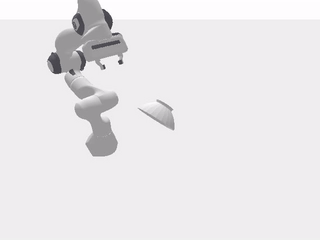

('acronym-GF_known_initik_newparams-4', 'gifs', 'Mug_40f9a6cc6b2c3b3a78060a3a3a55e18f_0.0006670441940038386_16.gif')


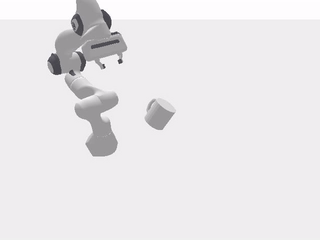

('acronym-GF_known_initik_newparams-4', 'gifs', 'Bowl_9a52843cc89cd208362be90aaa182ec6_0.0008104428339208306_22.gif')


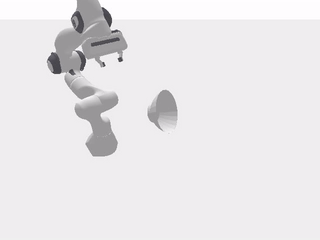

('acronym-GF_known_initik_newparams-4', 'gifs', 'Bowl_9a52843cc89cd208362be90aaa182ec6_0.0008104428339208306_14.gif')


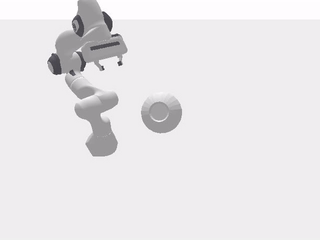

('acronym-GF_known_initik_newparams-4', 'gifs', 'Book_b1611143b4da5c783143cfc9128d0843_0.023835858278933857_1.gif')


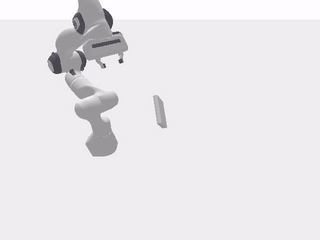

('acronym-GF_known_initik_newparams-4', 'gifs', 'Bowl_9a52843cc89cd208362be90aaa182ec6_0.0008104428339208306_23.gif')


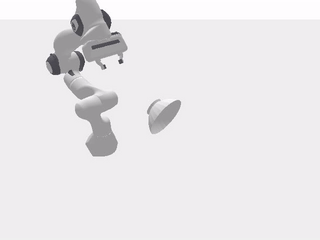

('acronym-GF_known_initik_newparams-4', 'gifs', 'Bowl_9a52843cc89cd208362be90aaa182ec6_0.0008104428339208306_24.gif')


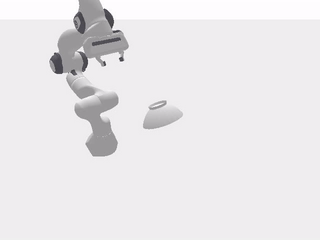

('acronym-GF_known_initik_newparams-4', 'gifs', 'Mug_40f9a6cc6b2c3b3a78060a3a3a55e18f_0.0006670441940038386_13.gif')


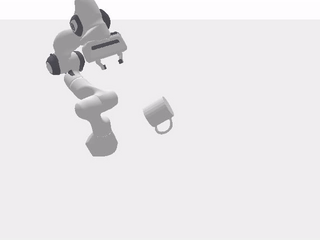

('acronym-GF_known_initik_newparams-4', 'gifs', 'Mug_40f9a6cc6b2c3b3a78060a3a3a55e18f_0.0006670441940038386_7.gif')


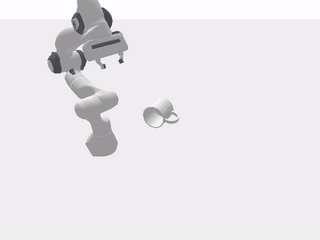

('acronym-GF_known_initik_newparams-4', 'gifs', 'Bottle_244894af3ba967ccd957eaf7f4edb205_0.012953570261294404_29.gif')


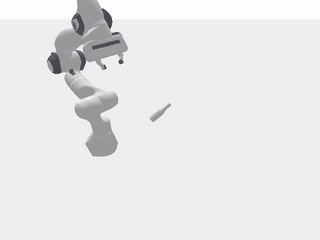

In [97]:
eval_name = 'acronym'
variant = 'GF_known_initik_newparams'
sample_gifs(eval_name, variant, exp_df, success=False, num_samples=10)

In [104]:
root_dir='/data/manifolds/pybullet_eval/multirun'
exp_name = 'GF_poststandoff_ycb'
exp_path = Path(f'{root_dir}/{exp_name}')
exp_df, evals, htmls, mds = get_experiment_results(exp_path)
print_htmls_mds(htmls, mds)

# ycb evaluation

,execution,planning,smoothness,collision,time
run,,,,,
ycb-GF_known-1,0.18 +/- 0.4,0.91 +/- 0.3,12.58 +/- 8.9,7.38 +/- 7.1,35.76 +/- 3.7
ycb-GF_known_initik-2,0.44 +/- 0.5,0.67 +/- 0.5,17.72 +/- 7.0,22.48 +/- 32.4,24.66 +/- 15.3
ycb-GF_known_initik_newparams-4,0.7 +/- 0.5,0.61 +/- 0.5,17.45 +/- 7.2,20.77 +/- 29.7,44.73 +/- 32.3
ycb-GF_known_newparams-3,0.69 +/- 0.5,0.59 +/- 0.5,16.91 +/- 7.5,18.9 +/- 27.6,53.06 +/- 24.6
ycb-GF_known_standoff-0,0.65 +/- 0.5,0.97 +/- 0.2,20.39 +/- 5.5,5.87 +/- 11.4,21.37 +/- 8.4
ycb-compOMG_known-0,0.92 +/- 0.3,0.87 +/- 0.3,17.54 +/- 7.1,17.36 +/- 10.6,1.69 +/- 0.9


# ycb evaluation
| run                             | execution    | planning     | smoothness    | collision      | time           |
|:--------------------------------|:-------------|:-------------|:--------------|:---------------|:---------------|
| ycb-GF_known-1                  | 0.18 +/- 0.4 | 0.91 +/- 0.3 | 12.58 +/- 8.9 | 7.38 +/- 7.1   | 35.76 +/- 3.7  |
| ycb-GF_known_initik-2           | 0.44 +/- 0.5 | 0.67 +/- 0.5 | 17.72 +/- 7.0 | 22.48 +/- 32.4 | 24.66 +/- 15.3 |
| ycb-GF_known_initik_newparams-4 | 0.7 +/- 0.5  | 0.61 +/- 0.5 | 17.45 +/- 7.2 | 20.77 +/- 29.7 | 44.73 +/- 32.3 |
| ycb-GF_known_newparams-3        | 0.69 +/- 0.5 | 0.59 +/- 0.5 | 16.91 +/- 7.5 | 18.9 +/- 27.6  | 53.06 +/- 24.6 |
| ycb-GF_known_standoff-0         | 0.65 +/- 0.5 | 0.97 +/- 0.2 | 20.39 +/- 5.5 | 5.87 +/- 11.4  | 21.37 +/- 8.4  |
| ycb-compOMG_known-0             | 0.92 +/- 0.3 | 0.87 +/- 0.3 | 17.54 +/- 7.1 | 17.36 +/- 10.6 | 1.69 +/- 0.9   |


('ycb-GF_known_initik_newparams-4', 'gifs', '021_bleach_cleanser_scene_29.gif')


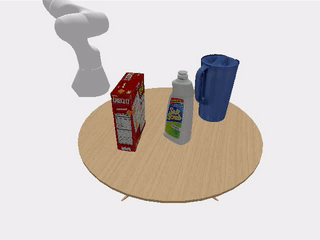

('ycb-GF_known_initik_newparams-4', 'gifs', '005_tomato_soup_can_scene_95.gif')


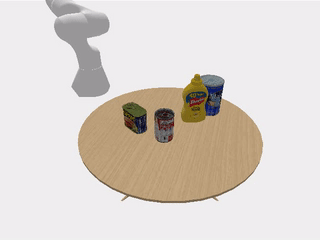

('ycb-GF_known_initik_newparams-4', 'gifs', '006_mustard_bottle_scene_61.gif')


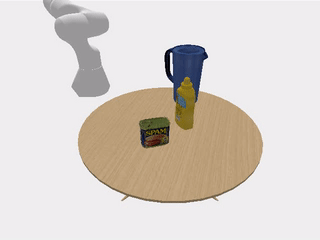

('ycb-GF_known_initik_newparams-4', 'gifs', '004_sugar_box_scene_50.gif')


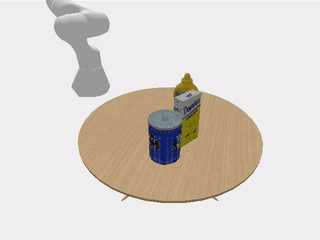

('ycb-GF_known_initik_newparams-4', 'gifs', '021_bleach_cleanser_scene_93.gif')


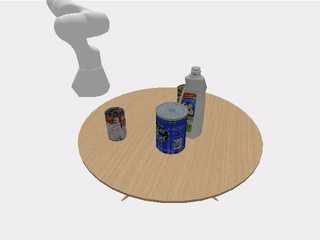

('ycb-GF_known_initik_newparams-4', 'gifs', '021_bleach_cleanser_scene_88.gif')


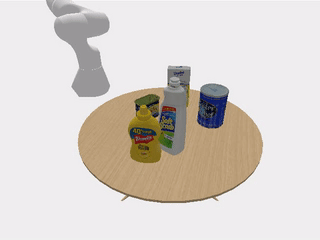

('ycb-GF_known_initik_newparams-4', 'gifs', '006_mustard_bottle_scene_94.gif')


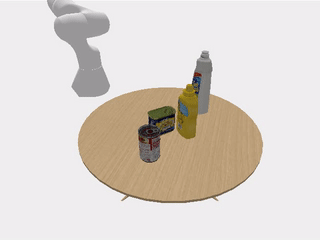

('ycb-GF_known_initik_newparams-4', 'gifs', '006_mustard_bottle_scene_56.gif')


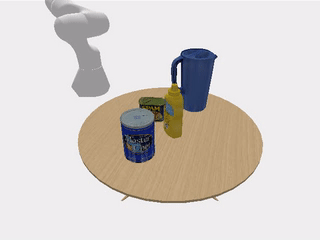

('ycb-GF_known_initik_newparams-4', 'gifs', '005_tomato_soup_can_scene_70.gif')


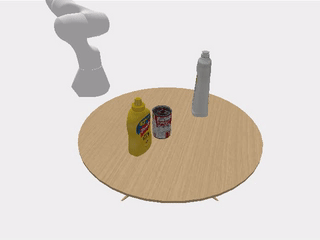

('ycb-GF_known_initik_newparams-4', 'gifs', '021_bleach_cleanser_scene_79.gif')


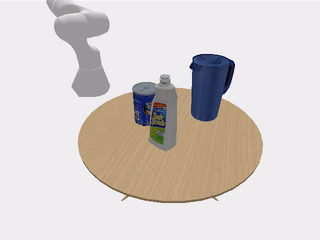

In [106]:
eval_name = 'ycb'
variant = 'GF_known_initik_newparams'
sample_gifs(eval_name, variant, exp_df, success=False, num_samples=10)
# sample_gifs(eval_name, variant, exp_df, success=True, num_samples=10)

In [101]:
root_dir='/data/manifolds/pybullet_eval/multirun'
exp_name = 'GF_poststandoff_obs'
exp_path = Path(f'{root_dir}/{exp_name}')
exp_df, evals, htmls, mds = get_experiment_results(exp_path)
print_htmls_mds(htmls, mds)

# acronym_obs evaluation

,execution,planning,smoothness,collision,time
run,,,,,
acronym_obs-GF_known-1,0.12 +/- 0.3,0.8 +/- 0.4,7.35 +/- 5.5,0.56 +/- 2.6,46.01 +/- 8.3
acronym_obs-GF_known_initik-4,0.56 +/- 0.5,0.52 +/- 0.5,4.71 +/- 2.5,2.2 +/- 3.1,34.55 +/- 15.3
acronym_obs-GF_known_initik_newparams-5,0.64 +/- 0.5,0.59 +/- 0.5,5.02 +/- 2.8,2.47 +/- 3.8,47.04 +/- 31.2
acronym_obs-GF_known_newparams-3,0.65 +/- 0.5,0.62 +/- 0.5,7.26 +/- 3.0,2.71 +/- 4.4,49.1 +/- 26.8
acronym_obs-GF_known_standoff-2,0.64 +/- 0.5,0.81 +/- 0.4,9.09 +/- 3.5,1.33 +/- 2.0,27.97 +/- 9.8
acronym_obs-compOMG_known-0,0.74 +/- 0.4,0.91 +/- 0.3,20.11 +/- 9.4,1.78 +/- 3.2,13.55 +/- 3.6


# acronym_obs evaluation
| run                                     | execution    | planning     | smoothness    | collision    | time           |
|:----------------------------------------|:-------------|:-------------|:--------------|:-------------|:---------------|
| acronym_obs-GF_known-1                  | 0.12 +/- 0.3 | 0.8 +/- 0.4  | 7.35 +/- 5.5  | 0.56 +/- 2.6 | 46.01 +/- 8.3  |
| acronym_obs-GF_known_initik-4           | 0.56 +/- 0.5 | 0.52 +/- 0.5 | 4.71 +/- 2.5  | 2.2 +/- 3.1  | 34.55 +/- 15.3 |
| acronym_obs-GF_known_initik_newparams-5 | 0.64 +/- 0.5 | 0.59 +/- 0.5 | 5.02 +/- 2.8  | 2.47 +/- 3.8 | 47.04 +/- 31.2 |
| acronym_obs-GF_known_newparams-3        | 0.65 +/- 0.5 | 0.62 +/- 0.5 | 7.26 +/- 3.0  | 2.71 +/- 4.4 | 49.1 +/- 26.8  |
| acronym_obs-GF_known_standoff-2         | 0.64 +/- 0.5 | 0.81 +/- 0.4 | 9.09 +/- 3.5  | 1.33 +/- 2.0 | 27.97 +/- 9.8  |
| acronym_obs-compOMG_known-0             | 0.74 +/- 0.4 | 0.91 +/- 0.3 | 20.11 +/- 9.4 | 1.78 +/- 3.2 | 13.55 +/- 3.6  |

('acronym_obs-GF_known_initik_newparams-5', 'gifs', 'Mug_40f9a6cc6b2c3b3a78060a3a3a55e18f_0.0006670441940038386_19.gif')


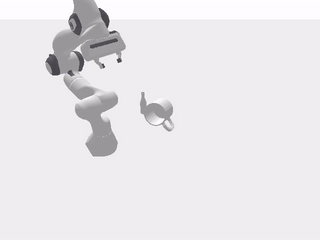

('acronym_obs-GF_known_initik_newparams-5', 'gifs', 'Bowl_9a52843cc89cd208362be90aaa182ec6_0.0008104428339208306_24.gif')


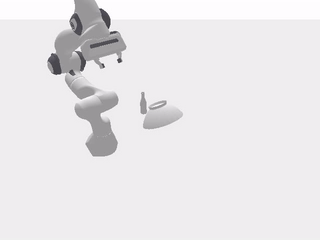

('acronym_obs-GF_known_initik_newparams-5', 'gifs', 'Bowl_9a52843cc89cd208362be90aaa182ec6_0.0008104428339208306_15.gif')


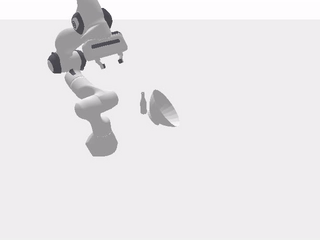

('acronym_obs-GF_known_initik_newparams-5', 'gifs', 'Book_b1611143b4da5c783143cfc9128d0843_0.023835858278933857_2.gif')


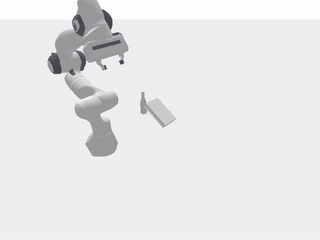

('acronym_obs-GF_known_initik_newparams-5', 'gifs', 'Mug_40f9a6cc6b2c3b3a78060a3a3a55e18f_0.0006670441940038386_4.gif')


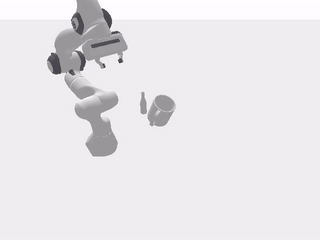

('acronym_obs-GF_known_initik_newparams-5', 'gifs', 'Bowl_9a52843cc89cd208362be90aaa182ec6_0.0008104428339208306_14.gif')


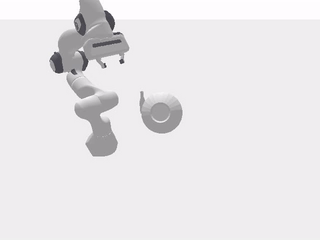

('acronym_obs-GF_known_initik_newparams-5', 'gifs', 'Bowl_9a52843cc89cd208362be90aaa182ec6_0.0008104428339208306_16.gif')


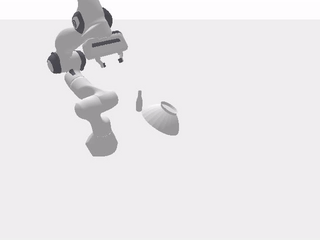

('acronym_obs-GF_known_initik_newparams-5', 'gifs', 'Book_b1611143b4da5c783143cfc9128d0843_0.023835858278933857_5.gif')


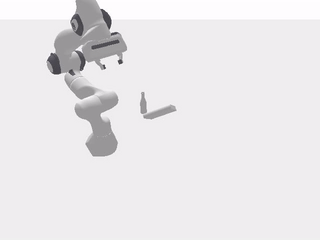

('acronym_obs-GF_known_initik_newparams-5', 'gifs', 'Bowl_9a52843cc89cd208362be90aaa182ec6_0.0008104428339208306_26.gif')


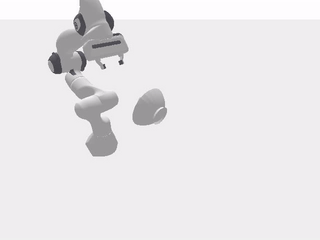

('acronym_obs-GF_known_initik_newparams-5', 'gifs', 'Bowl_9a52843cc89cd208362be90aaa182ec6_0.0008104428339208306_21.gif')


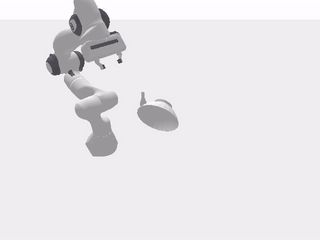

In [102]:
eval_name = 'acronym_obs'
variant = 'GF_known_initik_newparams'
sample_gifs(eval_name, variant, exp_df, success=False, num_samples=10)

# (Older) Fixed SDF bug
SDF bug meant that collisions were not working properly. After collision bug was fixed performance is much higher.

In [12]:
# acronym
exp_name = 'compOMG_known_2022-06-15_214652'
methods = ['4']
print_results(exp_name, methods, path='/data/manifolds/pybullet_eval/multirun/fixed_sdf', avg_only=True)
exp_name = 'GF_known_2022-06-15_214652'
methods = ['0']
print_results(exp_name, methods, path='/data/manifolds/pybullet_eval/multirun/fixed_sdf', avg_only=True)
exp_name = 'GF_known_2022-06-20_191853'
methods = ['0']
print_results(exp_name, methods, path='/data/manifolds/pybullet_eval/multirun/initik3', avg_only=True)
exp_name = 'GF_known_initik_2022-06-20_191853'
methods = ['1']
print_results(exp_name, methods, path='/data/manifolds/pybullet_eval/multirun/initik3', avg_only=True)
exp_name = 'GF_known_initik_2022-06-20_191853'
methods = ['2']
print_results(exp_name, methods, path='/data/manifolds/pybullet_eval/multirun/initik3', avg_only=True)
# exp_name = 'GF_known_mincosttraj_2022-06-15_214652'
# methods = ['2']
# print_results(exp_name, methods, path='/data/manifolds/pybullet_eval/multirun/fixed_sdf', avg_only=True)

4
Total Trials: 1
scene_idx       14.5 +/- 8.69
execution        0.81 +/- 0.4
planning        0.95 +/- 0.22
smoothness    17.98 +/- 10.89
collision       1.44 +/- 2.51
time           13.22 +/- 3.62
dtype: object
0
Total Trials: 1
scene_idx     14.5 +/- 8.69
execution     0.61 +/- 0.49
planning        0.8 +/- 0.4
smoothness    9.42 +/- 2.88
collision     1.13 +/- 2.05
time          27.3 +/- 9.99
dtype: object
0
Total Trials: 1
scene_idx      14.5 +/- 8.69
execution      0.61 +/- 0.49
planning         0.8 +/- 0.4
smoothness     9.42 +/- 2.88
collision      1.13 +/- 2.05
time          27.34 +/- 9.92
dtype: object
1
Total Trials: 1
scene_idx       14.5 +/- 8.69
execution        0.57 +/- 0.5
planning        0.82 +/- 0.38
smoothness      5.12 +/- 2.83
collision       0.87 +/- 1.76
time          22.09 +/- 11.36
dtype: object
2
Total Trials: 1
scene_idx       14.5 +/- 8.69
execution        0.7 +/- 0.46
planning        0.92 +/- 0.28
smoothness      5.36 +/- 3.13
collision       0.18 +/- 0.77
ti

/home/exx/miniconda3/envs/gm_ndf/lib/python3.7/site-packages/ipykernel_launcher.py:18: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.


# (Older) Results on CHOMP vs. CHOMP-Adam
CHOMP-Adam is better able to minimize error with target, CHOMP with a fixed step size fails as it oscillates around the minimum.

In [125]:
exp_name = 'GF_known_2022-06-09_220622'
methods = ['0'] # CHOMP with adam
print_results(exp_name, methods, path='/data/manifolds/pybullet_eval/multirun/vanilla_vs_adam')

0
Total Trials: 1
scene_idx        14.5 +/- 8.69
execution         0.51 +/- 0.5
planning         0.95 +/- 0.22
smoothness     25.21 +/- 84.41
collision     14.35 +/- 123.85
time            26.39 +/- 9.76
dtype: object
                                                        execution  \
object_name                                                         
Book_b1611143b4da5c783143cfc9128d0843_0.0238358...    0.5 +/- 0.5   
Bottle_244894af3ba967ccd957eaf7f4edb205_0.01295...  0.67 +/- 0.47   
Bowl_9a52843cc89cd208362be90aaa182ec6_0.0008104...   0.4 +/- 0.49   
Mug_40f9a6cc6b2c3b3a78060a3a3a55e18f_0.00066704...   0.47 +/- 0.5   

                                                       planning  \
object_name                                                       
Book_b1611143b4da5c783143cfc9128d0843_0.0238358...  0.8 +/- 0.4   
Bottle_244894af3ba967ccd957eaf7f4edb205_0.01295...  1.0 +/- 0.0   
Bowl_9a52843cc89cd208362be90aaa182ec6_0.0008104...  1.0 +/- 0.0   
Mug_40f9a6cc6b2c3b3a78060a3a3a55

/home/exx/miniconda3/envs/gm_ndf/lib/python3.7/site-packages/ipykernel_launcher.py:19: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.


In [127]:
exp_name = 'origOMG_known_col_2022-06-11_172112'
methods = ['0'] # GF_known (similar to CHOMP-Adam) 
print_results(exp_name, methods, path='/data/manifolds/pybullet_eval/multirun/vanilla_vs_adam')

0
Total Trials: 1
scene_idx      14.5 +/- 8.69
execution      0.91 +/- 0.29
planning       0.98 +/- 0.16
smoothness      8.4 +/- 4.93
collision     8.62 +/- 60.15
time          12.23 +/- 3.41
dtype: object
                                                        execution  \
object_name                                                         
Book_b1611143b4da5c783143cfc9128d0843_0.0238358...  0.97 +/- 0.18   
Bottle_244894af3ba967ccd957eaf7f4edb205_0.01295...    1.0 +/- 0.0   
Bowl_9a52843cc89cd208362be90aaa182ec6_0.0008104...    0.9 +/- 0.3   
Mug_40f9a6cc6b2c3b3a78060a3a3a55e18f_0.00066704...  0.77 +/- 0.42   

                                                       planning  \
object_name                                                       
Book_b1611143b4da5c783143cfc9128d0843_0.0238358...  0.9 +/- 0.3   
Bottle_244894af3ba967ccd957eaf7f4edb205_0.01295...  1.0 +/- 0.0   
Bowl_9a52843cc89cd208362be90aaa182ec6_0.0008104...  1.0 +/- 0.0   
Mug_40f9a6cc6b2c3b3a78060a3a3a55e18f_0.00066

/home/exx/miniconda3/envs/gm_ndf/lib/python3.7/site-packages/ipykernel_launcher.py:19: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.


In [126]:
exp_name = 'GF_known_noadam_2022-06-11_171819'
methods = ['0'] # vanilla CHOMP 
print_results(exp_name, methods, path='/data/manifolds/pybullet_eval/multirun/vanilla_vs_adam')

0
Total Trials: 1
scene_idx        14.5 +/- 8.69
execution          0.0 +/- 0.0
planning         0.98 +/- 0.13
smoothness        4.82 +/- 5.5
collision     17.63 +/- 146.98
time            20.47 +/- 3.53
dtype: object
                                                      execution  \
object_name                                                       
Book_b1611143b4da5c783143cfc9128d0843_0.0238358...  0.0 +/- 0.0   
Bottle_244894af3ba967ccd957eaf7f4edb205_0.01295...  0.0 +/- 0.0   
Bowl_9a52843cc89cd208362be90aaa182ec6_0.0008104...  0.0 +/- 0.0   
Mug_40f9a6cc6b2c3b3a78060a3a3a55e18f_0.00066704...  0.0 +/- 0.0   

                                                         planning  \
object_name                                                         
Book_b1611143b4da5c783143cfc9128d0843_0.0238358...  0.93 +/- 0.25   
Bottle_244894af3ba967ccd957eaf7f4edb205_0.01295...    1.0 +/- 0.0   
Bowl_9a52843cc89cd208362be90aaa182ec6_0.0008104...    1.0 +/- 0.0   
Mug_40f9a6cc6b2c3b3a78060a3a3a55e1

/home/exx/miniconda3/envs/gm_ndf/lib/python3.7/site-packages/ipykernel_launcher.py:19: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
